In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Importing the Libraries'

In [13]:
import torch
import torchvision
from glob import glob
import torch.nn as nn
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch.nn.functional as F
import torchvision.transforms as transform
from torch.utils.data import DataLoader,Dataset
from torch.utils.tensorboard import SummaryWriter
from torchvision.utils import make_grid

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


### Fetching the dataset

In [8]:
train_path = glob('/content/drive/MyDrive/cityscapes_data/train/*')
valid_path = glob('/content/drive/MyDrive/cityscapes_data/val/*')

### Dataset vizvalization

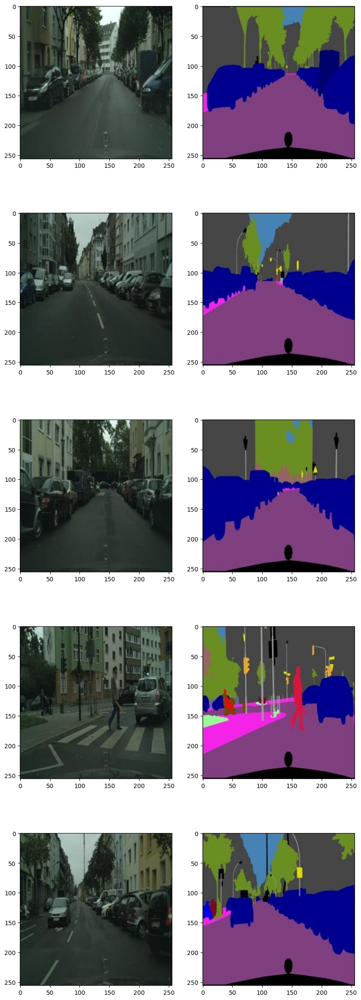

In [9]:
fig,ax = plt.subplots(5,2,figsize=(10,30))
for i in range(5):
    img = plt.imread(train_path[i])
    ax[i][0].imshow(img[:,:256])
    ax[i][1].imshow(img[:,256:])

### Defining Custom Dataset

In [10]:
train_dataset = []
validation_dataset = []

In [11]:
class MyDataset(Dataset):

    def __init__(self, images_path ,transform_img=None ,transform_label=None):

        self.images_path = images_path
        self.transform_img = transform_img
        self.transform_label = transform_label

    def __len__(self):
        return len(self.images_path)

    def __getitem__(self, idx):

        img = plt.imread(self.images_path[idx])
        image,label = img[:,:int(img.shape[1]/2)],img[:,int(img.shape[1]/2):]

        if self.transform_img:
            image = self.transform_img(image)

        if self.transform_label:
            label = self.transform_label(label)

        return image, label

### Defining the Transfoms

In [15]:
mytransformsImage = transform.Compose(
    [
        transform.ToTensor(),
        #transform.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
        transform.RandomHorizontalFlip(p=0.9)
    ]
)

mytransformsLabel = transform.Compose(
    [
        transform.ToTensor(),
    ]
)

In [16]:
# train dataset
traindata = MyDataset(train_path, mytransformsImage, mytransformsLabel)
# val dataset
valdata = MyDataset(valid_path, mytransformsImage, mytransformsLabel)

In [17]:
# Creating the DataLoaders
batch_size = 4
train_loader = DataLoader(traindata,batch_size)
vaild_loader = DataLoader(valdata,1)

In [18]:
# inverse_transform = transform.Compose([
#     transform.Normalize((-0.485/0.229, -0.456/0.224, -0.406/0.225), (1/0.229, 1/0.224, 1/0.225))
# ])


In [19]:

'''
    This is a helper function.
    This will help in ploting the masked got from the model.

'''
def show(img,output,label,denorm = False):
    img,output,label = img.cpu(),output.cpu(),label.cpu()
    fig,ax = plt.subplots(len(output),3,figsize=(10,10))

    for i in range(len(output)):
        if(len(output) == 3):
            Img,Lab,act = img[i],output[i],label[i]
            Img,Lab,act = Img,Lab.detach().permute(1,2,0).numpy(),act
            ax[i][0].imshow(Img.permute(1,2,0))
            ax[i][1].imshow(Lab)
            ax[i][2].imshow(act.permute(1,2,0))
        else:
            Img,Lab,act = img[i],output[i],label[i]
            Img,Lab,act = Img,Lab.detach().permute(1,2,0).numpy(),act
            ax[0].imshow(Img.permute(1,2,0))
            ax[1].imshow(Lab)
            ax[2].imshow(act.permute(1,2,0))
    plt.show()

In [20]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'

# Building UNet Model Architecture

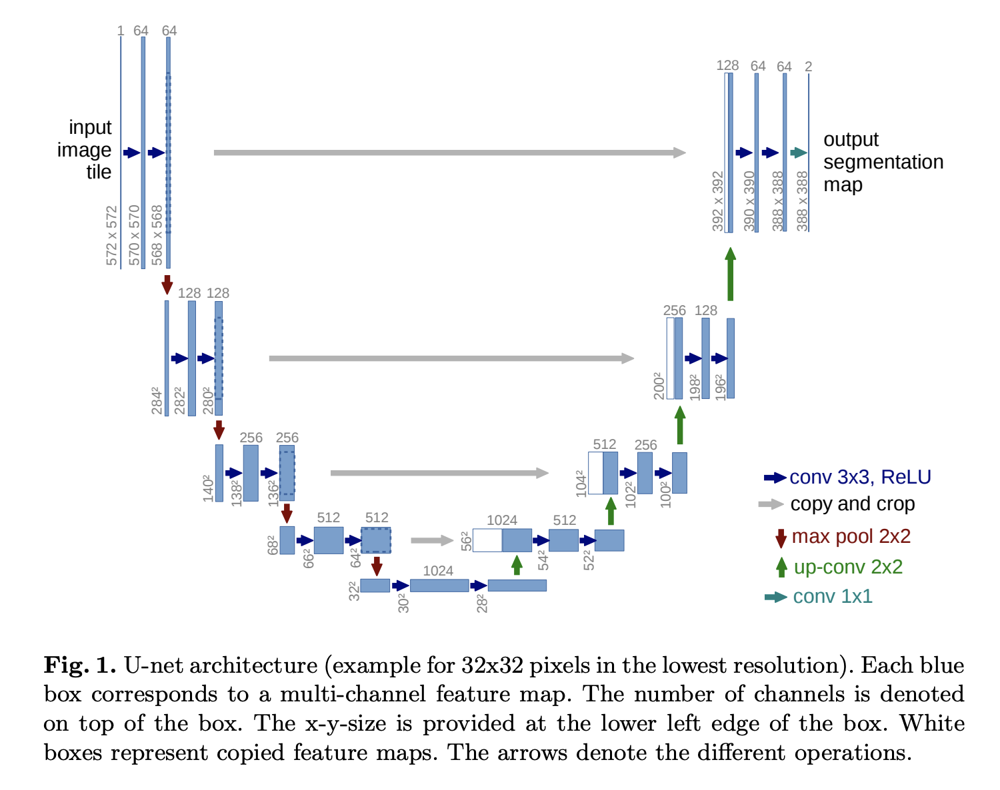

In [21]:
'''

    This Module representes the individual horizontal conv block layers in the Unet Model.
    Conv() -> BatchNorm() -> ReLU() -> Conv() -> ReLU()

'''

class Convblock(nn.Module):

      def __init__(self,input_channel,output_channel,kernal=3,stride=1,padding=1):

        super().__init__()
        self.convblock = nn.Sequential(
            nn.Conv2d(input_channel,output_channel,kernal,stride,padding),
            nn.BatchNorm2d(output_channel),
            nn.ReLU(inplace=True),
            nn.Conv2d(output_channel,output_channel,kernal),
            nn.ReLU(inplace=True),
        )


      def forward(self,x):
        x = self.convblock(x)
        return x

In [22]:
# Encoder -> BottelNeck => Decoder
class UNet(nn.Module):

    def __init__(self,input_channel,retain=True):

        super().__init__()

        self.conv1 = Convblock(input_channel,32)
        self.conv2 = Convblock(32,64)
        self.conv3 = Convblock(64,128)
        self.conv4 = Convblock(128,256)
        self.neck = nn.Conv2d(256,512,3,1)
        self.upconv4 = nn.ConvTranspose2d(512,256,3,2,0,1)
        self.dconv4 = Convblock(512,256)
        self.upconv3 = nn.ConvTranspose2d(256,128,3,2,0,1)
        self.dconv3 = Convblock(256,128)
        self.upconv2 = nn.ConvTranspose2d(128,64,3,2,0,1)
        self.dconv2 = Convblock(128,64)
        self.upconv1 = nn.ConvTranspose2d(64,32,3,2,0,1)
        self.dconv1 = Convblock(64,32)
        self.out = nn.Conv2d(32,3,1,1)
        self.retain = retain

    def forward(self,x):

        # Encoder Network

        # Conv down 1
        conv1 = self.conv1(x)
        pool1 = F.max_pool2d(conv1,kernel_size=2,stride=2)
        # Conv down 2
        conv2 = self.conv2(pool1)
        pool2 = F.max_pool2d(conv2,kernel_size=2,stride=2)
        # Conv down 3
        conv3 = self.conv3(pool2)
        pool3 = F.max_pool2d(conv3,kernel_size=2,stride=2)
        # Conv down 4
        conv4 = self.conv4(pool3)
        pool4 = F.max_pool2d(conv4,kernel_size=2,stride=2)

        # BottelNeck
        neck = self.neck(pool4)

        # Decoder Network

        # Upconv 1
        upconv4 = self.upconv4(neck)
        croped = self.crop(conv4,upconv4)
        # Making the skip connection 1
        dconv4 = self.dconv4(torch.cat([upconv4,croped],1))
        # Upconv 2
        upconv3 = self.upconv3(dconv4)
        croped = self.crop(conv3,upconv3)
        # Making the skip connection 2
        dconv3 = self.dconv3(torch.cat([upconv3,croped],1))
        # Upconv 3
        upconv2 = self.upconv2(dconv3)
        croped = self.crop(conv2,upconv2)
        # Making the skip connection 3
        dconv2 = self.dconv2(torch.cat([upconv2,croped],1))
        # Upconv 4
        upconv1 = self.upconv1(dconv2)
        croped = self.crop(conv1,upconv1)
        # Making the skip connection 4
        dconv1 = self.dconv1(torch.cat([upconv1,croped],1))
        # Output Layer
        out = self.out(dconv1)

        if self.retain == True:
            out = F.interpolate(out,list(x.shape)[2:])

        return out

    def crop(self,input_tensor,target_tensor):
        # For making the size of the encoder conv layer and the decoder Conv layer same
        _,_,H,W = target_tensor.shape
        return transform.CenterCrop([H,W])(input_tensor)




In [23]:
# initializing the model
model = UNet(3).float().to(device)

In [24]:
lr = 0.01
epochs = 30

In [25]:
# Choosing the loss function to be Mean Square Error Loss
lossfunc = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(), lr=lr)

In [26]:
train_acc = []
val_acc = []
train_loss = []
val_loss = []

### Creating the traning loop

  0%|          | 0/747 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torchvision/transforms/functional.py:152: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  img = torch.from_numpy(pic.transpose((2, 0, 1))).contiguous()
100%|██████████| 747/747 [11:47<00:00,  1.06it/s]


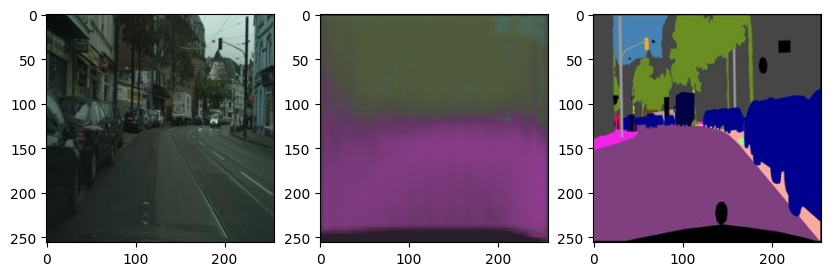

100%|██████████| 500/500 [01:50<00:00,  4.54it/s]


epoch : 0 ,train loss : 0.03704313226941838 ,valid loss : 0.031863268019631505 


100%|██████████| 500/500 [00:04<00:00, 108.00it/s]


epoch : 1 ,train loss : 0.03151852598132059 ,valid loss : 0.03127879895083606 


100%|██████████| 500/500 [00:04<00:00, 110.02it/s]


epoch : 2 ,train loss : 0.029724261692290005 ,valid loss : 0.03057527025602758 


100%|██████████| 500/500 [00:04<00:00, 109.59it/s]


epoch : 3 ,train loss : 0.029162299174720664 ,valid loss : 0.030229031501337884 


100%|██████████| 500/500 [00:04<00:00, 103.77it/s]


epoch : 4 ,train loss : 0.028786738820802894 ,valid loss : 0.03009599431976676 


100%|██████████| 747/747 [01:01<00:00, 12.20it/s]


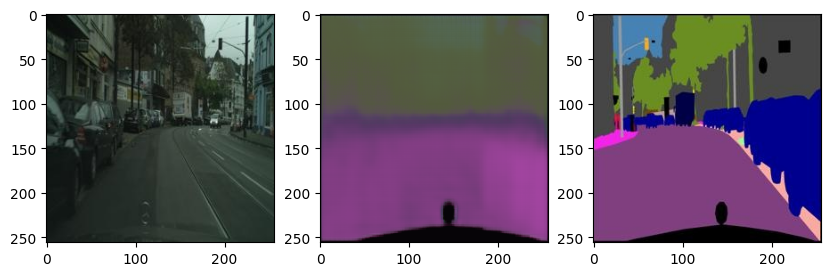

100%|██████████| 500/500 [00:04<00:00, 100.24it/s]


epoch : 5 ,train loss : 0.028502544929264698 ,valid loss : 0.029904280913993716 


100%|██████████| 500/500 [00:05<00:00, 97.52it/s]


epoch : 6 ,train loss : 0.02821683462015995 ,valid loss : 0.029737172761932017 


100%|██████████| 500/500 [00:04<00:00, 102.31it/s]


epoch : 7 ,train loss : 0.02802315228176085 ,valid loss : 0.029299115438014268 


100%|██████████| 500/500 [00:04<00:00, 107.74it/s]


epoch : 8 ,train loss : 0.02778249852349321 ,valid loss : 0.02895674609206617 


100%|██████████| 500/500 [00:04<00:00, 109.55it/s]


epoch : 9 ,train loss : 0.027625580338220122 ,valid loss : 0.028986074091866612 


100%|██████████| 747/747 [01:01<00:00, 12.17it/s]


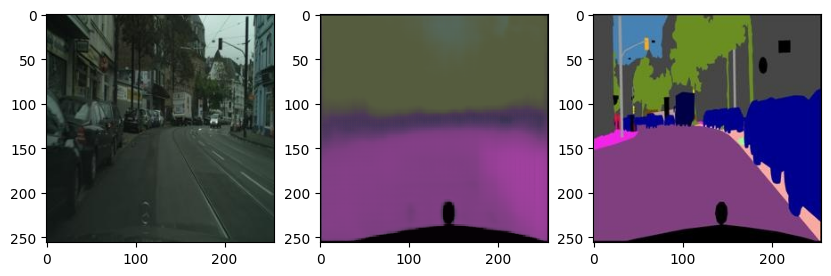

100%|██████████| 500/500 [00:05<00:00, 99.14it/s]


epoch : 10 ,train loss : 0.02747712308762862 ,valid loss : 0.02851424077898264 


100%|██████████| 500/500 [00:04<00:00, 105.03it/s]


epoch : 11 ,train loss : 0.027317716090514796 ,valid loss : 0.028194965701550244 


100%|██████████| 500/500 [00:04<00:00, 102.91it/s]


epoch : 12 ,train loss : 0.027150075372752335 ,valid loss : 0.027795877680182456 


100%|██████████| 500/500 [00:05<00:00, 99.79it/s] 


epoch : 13 ,train loss : 0.026959883914375243 ,valid loss : 0.027584676094353198 


100%|██████████| 500/500 [00:04<00:00, 103.79it/s]


epoch : 14 ,train loss : 0.026575162749951944 ,valid loss : 0.027101050309836866 


100%|██████████| 747/747 [01:01<00:00, 12.18it/s]


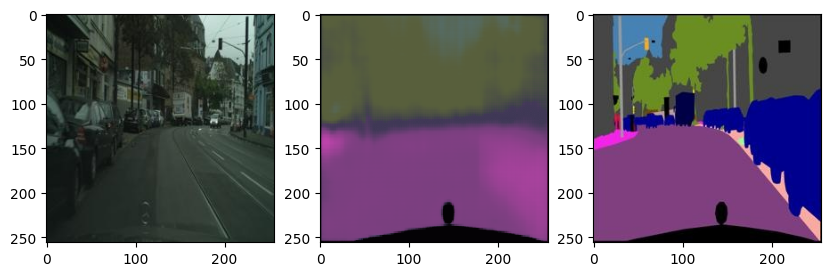

100%|██████████| 500/500 [00:04<00:00, 108.73it/s]


epoch : 15 ,train loss : 0.02624134886685704 ,valid loss : 0.026596449069678785 


100%|██████████| 500/500 [00:04<00:00, 108.48it/s]


epoch : 16 ,train loss : 0.026012849820705463 ,valid loss : 0.026390118040144444 


100%|██████████| 500/500 [00:04<00:00, 107.66it/s]


epoch : 17 ,train loss : 0.025816177911906837 ,valid loss : 0.02617081073112786 


100%|██████████| 500/500 [00:04<00:00, 101.47it/s]


epoch : 18 ,train loss : 0.025599070539176864 ,valid loss : 0.026417892947793006 


100%|██████████| 500/500 [00:04<00:00, 106.18it/s]


epoch : 19 ,train loss : 0.02526744160367303 ,valid loss : 0.02663404813967645 


100%|██████████| 747/747 [01:01<00:00, 12.17it/s]


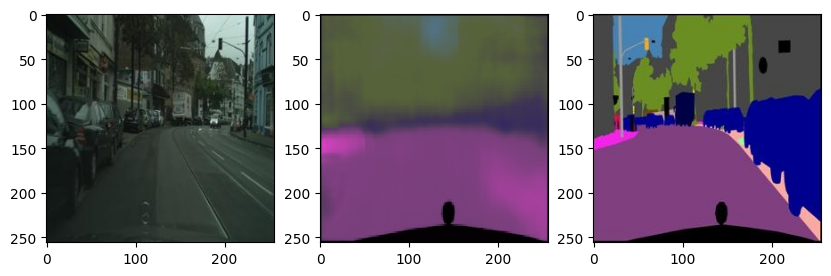

100%|██████████| 500/500 [00:04<00:00, 107.17it/s]


epoch : 20 ,train loss : 0.024909309819689796 ,valid loss : 0.026261607062071562 


100%|██████████| 500/500 [00:04<00:00, 107.61it/s]


epoch : 21 ,train loss : 0.02438902394369823 ,valid loss : 0.0265310492888093 


100%|██████████| 500/500 [00:04<00:00, 104.42it/s]


epoch : 22 ,train loss : 0.02386783314133225 ,valid loss : 0.026173171011731028 


100%|██████████| 500/500 [00:05<00:00, 96.76it/s] 


epoch : 23 ,train loss : 0.02338119042685712 ,valid loss : 0.026929873548448086 


100%|██████████| 500/500 [00:04<00:00, 102.50it/s]


epoch : 24 ,train loss : 0.023136838699580036 ,valid loss : 0.027064873956143855 


100%|██████████| 747/747 [01:01<00:00, 12.15it/s]


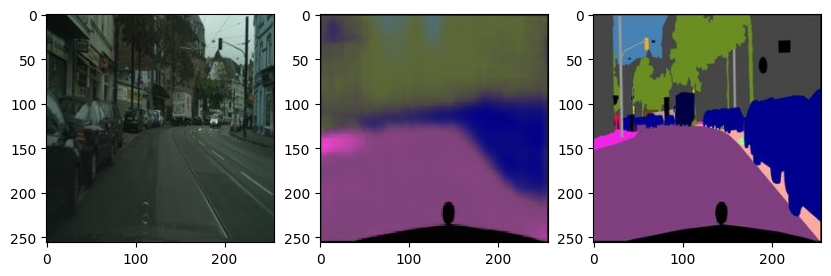

100%|██████████| 500/500 [00:04<00:00, 104.27it/s]


epoch : 25 ,train loss : 0.022700948936184007 ,valid loss : 0.02745156576856971 


100%|██████████| 500/500 [00:04<00:00, 108.79it/s]


epoch : 26 ,train loss : 0.0222037180951501 ,valid loss : 0.026621465981006624 


100%|██████████| 500/500 [00:04<00:00, 109.15it/s]


epoch : 27 ,train loss : 0.021831991367909802 ,valid loss : 0.0266345704998821 


100%|██████████| 500/500 [00:04<00:00, 102.15it/s]


epoch : 28 ,train loss : 0.02154196030055104 ,valid loss : 0.02674072247557342 


100%|██████████| 500/500 [00:05<00:00, 95.22it/s] 

epoch : 29 ,train loss : 0.021269701021053945 ,valid loss : 0.027410861626267432 


In [27]:
for i in range(epochs):

    trainloss = 0
    valloss = 0

    for img,label in tqdm(train_loader):
        '''
            Traning the Model.
        '''
        optimizer.zero_grad()
        img = img.to(device)
        label = label.to(device)
        output = model(img)
        loss = lossfunc(output,label)
        loss.backward()
        optimizer.step()
        trainloss+=loss.item()

    if(i%5==0):
        show(img,output,label)

    train_loss.append(trainloss/len(train_loader))

    for img,label in tqdm(vaild_loader):
        '''
            Validation of Model.
        '''
        img = img.to(device)
        label = label.to(device)
        output = model(img)
        loss = lossfunc(output,label)
        valloss+=loss.item()

    val_loss.append(valloss/len(vaild_loader))

    print("epoch : {} ,train loss : {} ,valid loss : {} ".format(i,train_loss[-1],val_loss[-1]))

# Ploting the Training VS Validation Loss Curve

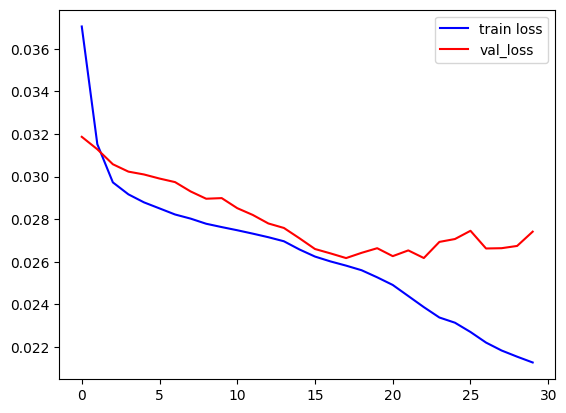

In [28]:
plt.plot(train_loss,color='b',label='train loss')
plt.plot(val_loss,color='r',label = 'val_loss')
plt.legend()

# Visualizing the Results

In [29]:
def show(img,output,label,denorm = False):
    img,output,label = img.cpu(),output.cpu(),label.cpu()
    fig,ax = plt.subplots(len(output),3,figsize=(15,30))
    cols = ['Input Image','Actual Output','Predicted Output']
    for i in range(len(output)):
        if(len(output) == 3):
            Img,Lab,act = img[i],output[i],label[i]
            Img,Lab,act = Img,Lab.detach().permute(1,2,0).numpy(),act
            ax[i][0].imshow(Img.permute(1,2,0))
            ax[i][2].imshow(Lab)
            ax[i][1].imshow(act.permute(1,2,0))
        else:
            Img,Lab,act = img[i],output[i],label[i]
            Img,Lab,act = Img,Lab.detach().permute(1,2,0).numpy(),act
            ax[0].imshow(Img.permute(1,2,0))
            ax[2].imshow(Lab)
            ax[1].imshow(act.permute(1,2,0))
            #ax[0].title('this')
            for ax, col in zip(ax, cols):
                ax.set_title(col)
    plt.show()

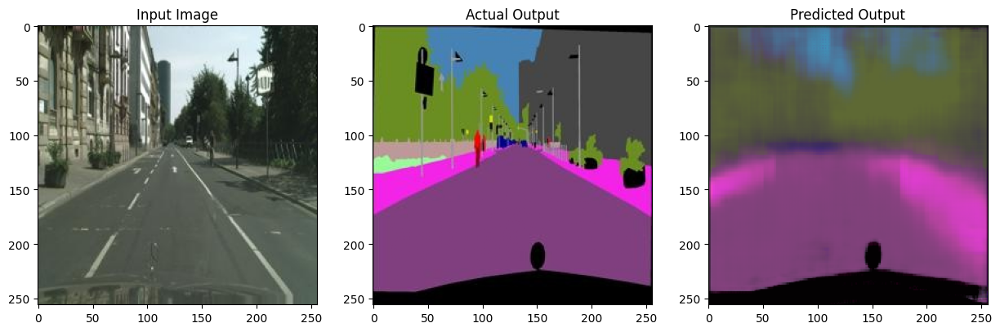

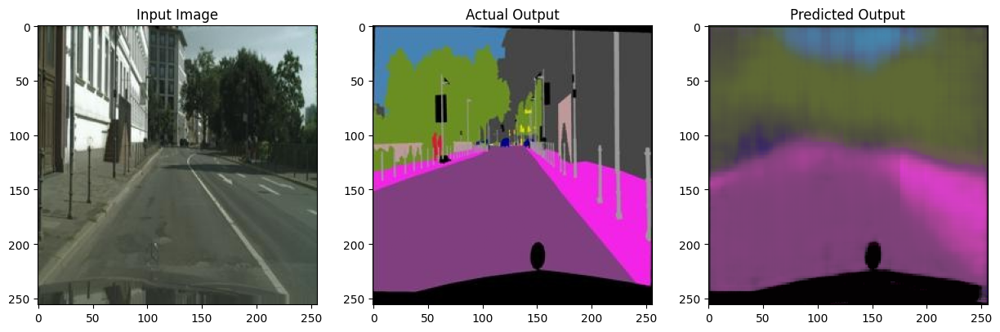

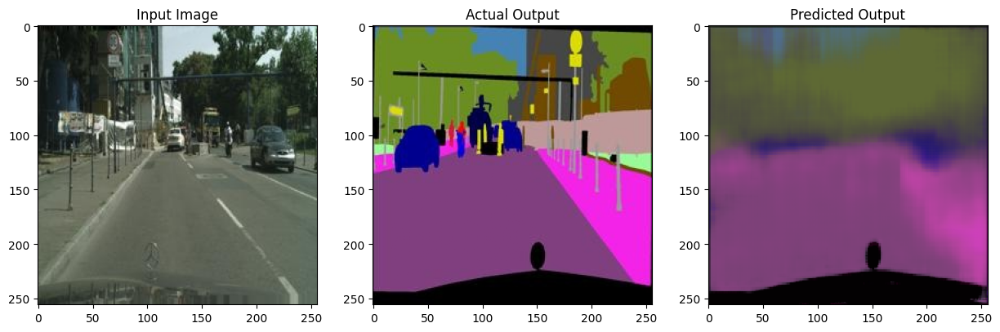

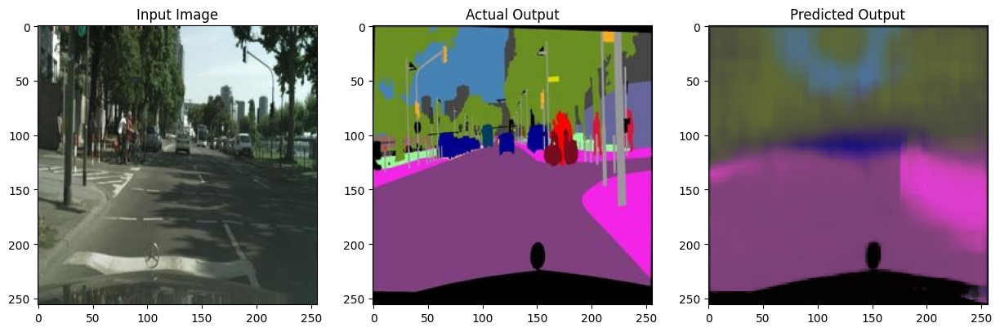

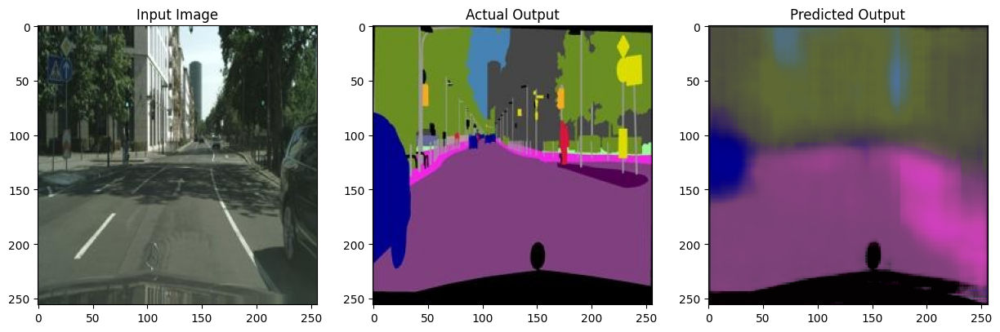

...

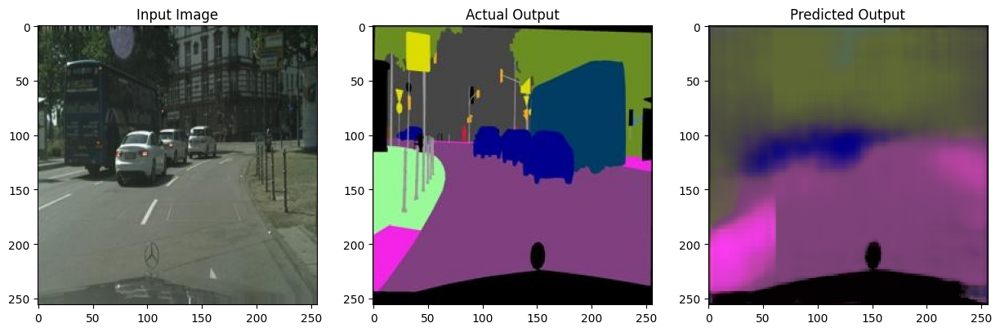

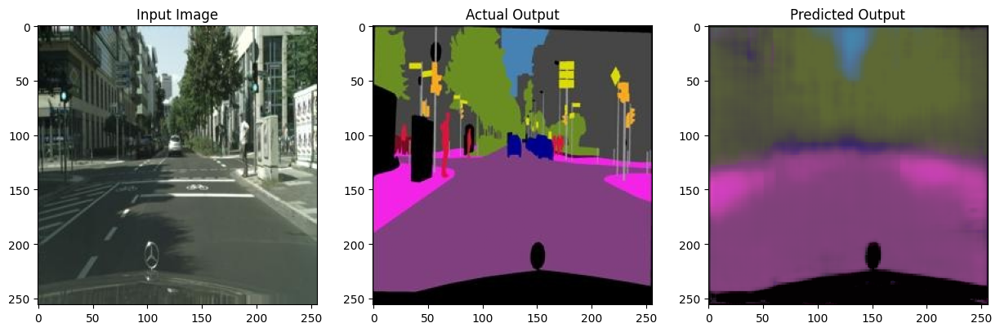

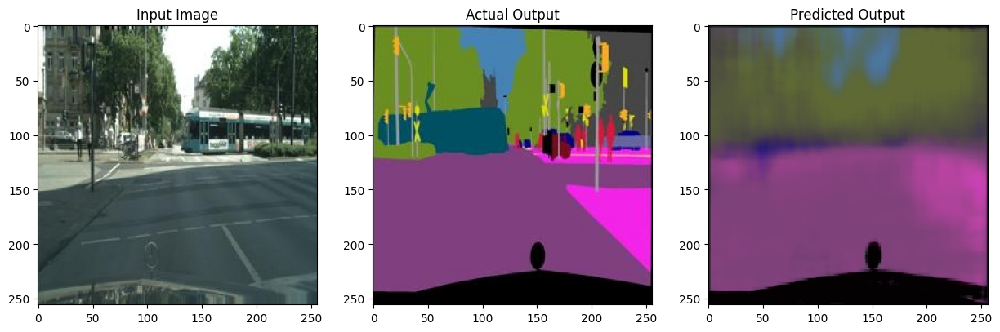

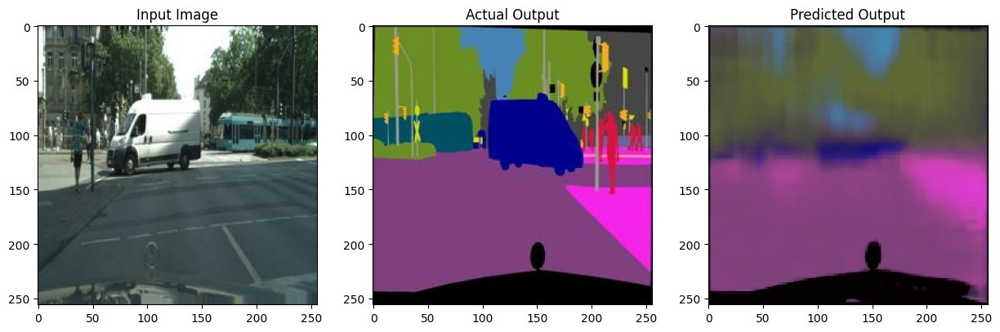

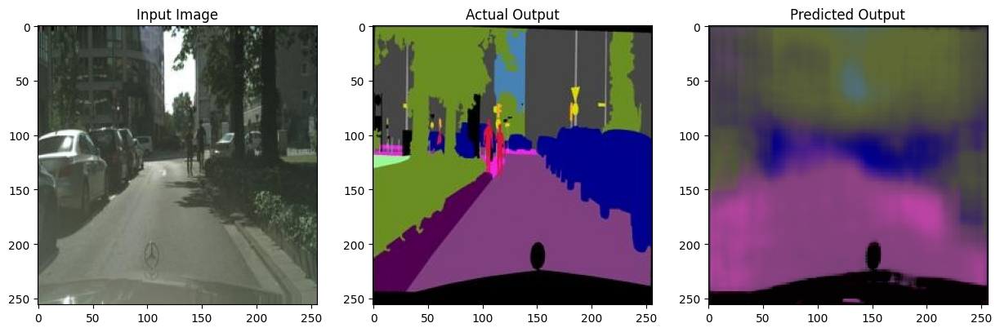

In [30]:
c = 0
for img,label in (vaild_loader):
        img = img.to(device)
        label = label.to(device)
        output = model(img)
        show(img,output,label)
        if c>20:
            break
        c+=1